# install package

In [1]:
# python -m venv python_env
# venv\Scripts\activate

   ---------------------------------------- 0.0/11.1 MB ? eta -:--:--
   ------------------------------- -------- 8.7/11.1 MB 49.0 MB/s eta 0:00:01
   ---------------------------------------- 11.1/11.1 MB 50.9 MB/s eta 0:00:00


In [ ]:
import sys
!{sys.executable} -m pip install numpy
!{sys.executable} -m pip install matplotlib
!{sys.executable} -m pip install scipy
!{sys.executable} -m pip install ipykernel
!{sys.executable} -m pip install ipympl
!{sys.executable} -m pip install mne
!{sys.executable} -m pip install scikit-learn


ERROR: Could not find a version that satisfies the requirement sklearn (from versions: none)
ERROR: No matching distribution found for sklearn


# load package

In [3]:
%matplotlib widget

In [18]:
import numpy as np
import matplotlib.pyplot as plt
import scipy
import scipy.stats
import mne

# params

In [5]:
debug = False

# Définition des paramètres
n_channels = 21  # Nombre de canaux EEG
sampling_rate = 250  # Fréquence d'échantillonnage en Hz
duration = 20 * 60  # Durée de l'enregistrement en secondes
n_samples = sampling_rate * duration  # Nombre total d'échantillons
n_triggers = 400  # Nombre total de triggers

# Définition desfreqs canaux EEG
channels = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'A1', 'A2', 'T3', 'C3', 'Cz', 'C4', 'T4', 'T5', 'P3', 'Pz', 'P4', 'T6', 'O1', 'O2']

n_perm = 250

# inspection functions

In [6]:
# to compare during preprocessing
#data_pre, data_post, srate, chan_name = EEG_data, raw.get_data(), sampling_rate, 'Fp1'
def compare_pre_post(data_pre, data_post, srate, chan_name):

    # compare before after
    nchan_i = channels.index(chan_name)
    x_pre = data_pre[nchan_i,:]
    x_post = data_post[nchan_i,:]
    time = np.arange(x_pre.shape[0]) / srate

    nwind = int(10*srate)
    nfft = nwind
    noverlap = np.round(nwind/2)
    hannw = scipy.signal.windows.hann(nwind)

    hzPxx, Pxx_pre = scipy.signal.welch(x_pre,fs=srate,window=hannw,nperseg=nwind,noverlap=noverlap,nfft=nfft)
    hzPxx, Pxx_post = scipy.signal.welch(x_post,fs=srate,window=hannw,nperseg=nwind,noverlap=noverlap,nfft=nfft)

    plt.figure()
    plt.plot(time, x_pre, label='x_pre')
    plt.plot(time, x_post, label='x_post')
    plt.title(chan_name)
    plt.legend()
    plt.show()

    plt.figure()
    plt.semilogy(hzPxx, Pxx_pre, label='Pxx_pre')
    plt.semilogy(hzPxx, Pxx_post, label='Pxx_post')
    plt.title(chan_name)
    plt.legend()
    # plt.xlim(60,360)
    plt.show()




def plot_PSD(x):

    hzPxx, Pxx = scipy.signal.welch(x, fs=sampling_rate, window='hann', nperseg=sampling_rate*20, noverlap=sampling_rate*20/2, nfft=None)
    plt.figure()
    plt.plot(hzPxx, Pxx)
    plt.yscale('log')
    plt.show()

# simulate data

In [7]:

def pink_noise(n_samples, n_channels):

    freqs = np.fft.rfftfreq(n_samples, d=1/sampling_rate) # on génère le vecteur des fréquences
    amplitudes = 1 / (freqs + 1e-10)  # le 1/f pour les amplitudes
    phases = np.random.uniform(0, 2*np.pi, (n_channels, len(freqs))) # les phases aléatoire pour les coefficients de fourier
    spectrum = amplitudes * (np.cos(phases) + 1j * np.sin(phases)) # génération du spectre de fréquence
    noise = np.fft.irfft(spectrum, n_samples) # inverse fft pour récupérer le signal en réel
    noise = scipy.stats.zscore(noise, axis=1) * 1e-6 # Normalisation des données pour avoir des micro volts
    
    if debug:

        plt.plot(freqs)
        plt.show()

        plt.plot(amplitudes)
        plt.show()

        plt.plot(noise[0,:])
        plt.show()

    return noise


def generate_data_set():

    # Génération de la matrice EEG avec du bruit rose
    EEG_data = pink_noise(n_samples, n_channels)

    # Ajout d'un signal 50 Hz avec une certaine amplitude
    f_noise = 50  # Fréquence de l'interférence
    amplitude_50hz = EEG_data.std()/100  # Niveau de l'interférence

    time = np.arange(n_samples) / sampling_rate
    interference = amplitude_50hz * np.sin(2 * np.pi * f_noise * time)

    if debug:

        plt.plot(interference)
        plt.show()

        plot_PSD(interference)

    EEG_data += interference

    if debug:

        plt.plot(EEG_data[0,:sampling_rate*5])
        plt.show()

        plot_PSD(EEG_data[0,:])

    # Génération du vecteur de triggers
    trigger_vector = np.zeros(n_samples)  # Initialisation avec des zéros

    # Génération des indices des triggers (espacés entre 2.5s et 3s)
    trigger_times = np.cumsum(np.random.uniform(2.5, 3, n_triggers))  
    trig_idxs = np.round(trigger_times * sampling_rate).astype(int)  # Conversion en indices

    # Séparation en deux types de triggers
    types = np.concatenate([np.ones((int(len(trig_idxs)/2))), np.ones((int(len(trig_idxs)/2)))+1])
    np.random.shuffle(types)
    trigger_vector[trig_idxs] = types
    trig_type = trigger_vector[trigger_vector != 0]

    # Génération des blinks
    blink_amplitude = 1
    blink_duration = 0.5  # s
    blink_samples = int(blink_duration * sampling_rate)
    blink_waveform = np.exp(-np.linspace(-2, 2, blink_samples)**2)
    blink_weights = np.array([1.0 if ch in ['Fp1', 'Fp2', 'F3', 'F4'] else 0.1 for ch in channels])

    blink_times = np.cumsum(np.random.uniform(0, 12, int(n_triggers/2)))  # Temps des blinks
    blink_idxs = np.round(blink_times * sampling_rate).astype(int)

    blink_sig = np.zeros((n_samples))

    for idx in blink_idxs:
        if idx + blink_samples < n_samples:
            blink_sig[idx:idx + blink_samples] = blink_waveform * blink_amplitude

    blink_sig *= EEG_data.std() # on scale le signal, plus important que pour le reste

    if debug:

        plt.plot(blink_sig)
        plt.show()

    # On ajoute le signal
    for ch_i, ch in enumerate(channels):

        EEG_data[ch_i,:] += blink_sig * blink_weights[ch_i]

    if debug:

        plt.plot(EEG_data[0,:])
        plt.show()

        plt.plot(EEG_data[-1,:])
        plt.show()

    # Génération des activités P1 et N1
    p1_amplitude = 0.5
    n1_amplitude = -0.4
    erp_duration = 0.1  # 100 ms
    p1_samples = n1_samples = int(erp_duration * sampling_rate)

    p1_waveform = p1_amplitude * np.exp(-np.linspace(-2, 2, p1_samples)**2)
    n1_waveform = n1_amplitude * np.exp(-np.linspace(-2, 2, n1_samples)**2)

    if debug:

        plt.plot(p1_waveform)
        plt.show()

        plt.plot(n1_waveform)
        plt.show()

    erp_weights = np.array([1.0 if ch in ['O1', 'O2'] else 0.7 if ch in ['T5', 'P3', 'Pz', 'P4', 'T6'] else 0 for ch in channels])

    erp_sig = np.zeros((n_samples))

    for idx, t in zip(trig_idxs, types):
        factor = 1 if t == 1 else 0.5  # Réduction de l'amplitude pour trigger 2
        p1_idx = idx + int(0.1 * sampling_rate)  # 600ms après trigger
        n1_idx = idx + int(0.2 * sampling_rate)  # 700ms après trigger
        if p1_idx + p1_samples < n_samples:
            erp_sig[p1_idx:p1_idx + p1_samples] = p1_waveform * factor
        if n1_idx + n1_samples < n_samples:
            erp_sig[n1_idx:n1_idx + n1_samples] = n1_waveform * factor

    erp_sig *= EEG_data.std()/5 # on scale le signal

    if debug:

        plt.plot(erp_sig)
        plt.show()

    # On ajoute le signal
    for ch_i, ch in enumerate(channels):

        EEG_data[ch_i,:] += erp_sig * erp_weights[ch_i]

    if debug:

        plt.plot(EEG_data[0,:])
        plt.show()

    # Génération des activités Theta et Gamma
    theta_duration = 0.750  # 500 ms
    gamma_duration = 0.300  # 150 ms
    theta_samples = int(theta_duration * sampling_rate)
    gamma_samples = int(gamma_duration * sampling_rate)
    theta_freq = 6  # Fréquence centrale de l'onde Theta
    gamma_freq = 80  # Fréquence centrale de l'onde Gamma

    theta_waveform = np.exp(-np.linspace(-2, 2, theta_samples)**2) * np.sin(2 * np.pi * theta_freq * np.linspace(0, theta_duration, theta_samples))
    gamma_waveform = np.exp(-np.linspace(-2, 2, gamma_samples)**2) * np.sin(2 * np.pi * gamma_freq * np.linspace(0, gamma_duration, gamma_samples))

    jitter = 0.15*sampling_rate

    # Gamma
    freq_weights = np.array([1.0 if ch in ['O1', 'O2'] else 0.0 for ch in channels])

    freq_sig = np.zeros((n_samples))

    jitter_list = np.array([np.random.randint(low=trig_i-jitter, high=trig_i+jitter, size=1)[0] for trig_i in trig_idxs])

    for idx, t in zip(jitter_list, types):
        factor = 1 if t == 1 else 0.5  # Réduction de l'amplitude pour trigger 2
        gamma_idx = idx + int(0.1 * sampling_rate)  # 500ms après trigger
        if gamma_idx + gamma_samples < n_samples:
            freq_sig[gamma_idx:gamma_idx + gamma_samples] = gamma_waveform * factor

    freq_sig *= EEG_data.std()/50 # on scale le signal

    if debug:

        plt.plot(freq_sig)
        plt.show()

    for ch_i, ch in enumerate(channels):

        EEG_data[ch_i,:] += freq_sig * freq_weights[ch_i]

    # Theta
    freq_sig = np.zeros((n_samples))

    freq_weights = np.array([1.0 if ch in ['Fp1', 'Fp2', 'Fz', 'F3', 'F4', 'O1', 'O2'] else 0.0 for ch in channels])

    jitter_list = np.array([np.random.randint(low=trig_i-jitter, high=trig_i+jitter, size=1)[0] for trig_i in trig_idxs])

    for idx, t in zip(jitter_list, types):
        factor = 1 if t == 1 else 0.5  # Réduction de l'amplitude pour trigger 2
        theta_idx = idx + int(0.2 * sampling_rate)  # 600ms après trigger
        if theta_idx + theta_samples < n_samples:
            freq_sig[theta_idx:theta_idx + theta_samples] = theta_waveform * factor

    freq_sig *= EEG_data.std()/10 # on scale le signal

    if debug:

        plt.plot(freq_sig)
        plt.show()

    # On ajoute le signal
    for ch_i, ch in enumerate(channels):

        EEG_data[ch_i,:] += freq_sig * freq_weights[ch_i]

    trig_idxs = trig_idxs.astype('int')
    trig_type = trig_type.astype('int')

    if debug:

        plt.plot(EEG_data[-1,:])
        plt.show()

    return EEG_data, trig_idxs, trig_type



In [8]:
EEG_data, trig_idxs, trig_type = generate_data_set()

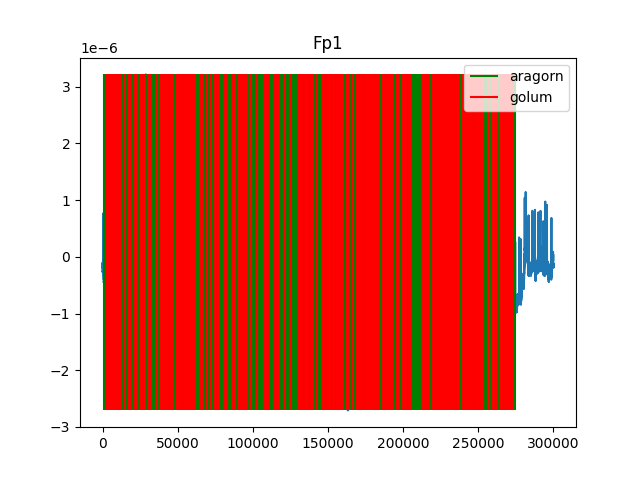

In [9]:
ch = 'Fp1'
ch_i = channels.index(ch)
x = EEG_data[ch_i,:] 
times = np.arange(x.size)
plt.figure()
plt.plot(times, x)
plt.title(ch)
plt.vlines(trig_idxs[trig_type == 1], ymin=x.min(), ymax=x.max(), color='g', label='aragorn')
plt.vlines(trig_idxs[trig_type == 2], ymin=x.min(), ymax=x.max(), color='r', label='golum')
plt.legend()
plt.show()

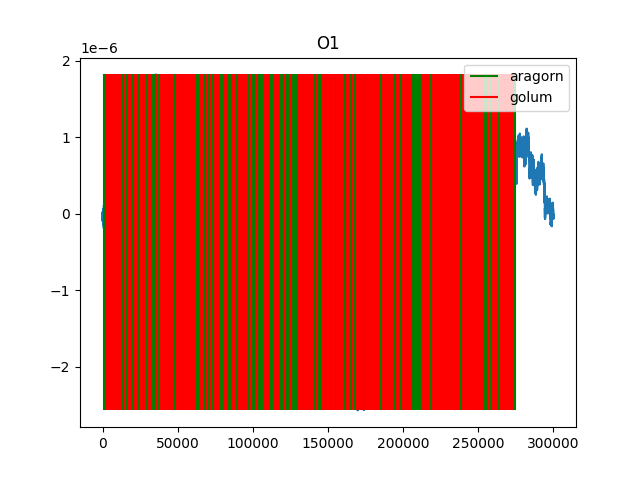

In [10]:
ch = 'O1'
ch_i = channels.index(ch)
x = EEG_data[ch_i,:] 
times = np.arange(x.size)
plt.figure()
plt.plot(times, x)
plt.title(ch)
plt.vlines(trig_idxs[trig_type == 1], ymin=x.min(), ymax=x.max(), color='g', label='aragorn')
plt.vlines(trig_idxs[trig_type == 2], ymin=x.min(), ymax=x.max(), color='r', label='golum')
plt.legend()
plt.show()

# preproc

## filter >1Hz + notch 50Hz

In [11]:
info = mne.create_info(ch_names=channels, sfreq=sampling_rate, ch_types='eeg')
info.set_montage('standard_1020')

raw = mne.io.RawArray(EEG_data.copy(), info)

# Suppression du 50Hz (et ses harmoniques jusqu'à 150Hz si besoin)
raw.filter(l_freq=1, h_freq=None)  # Filtre passe-haut (1 Hz pour supprimer la dérive)

Creating RawArray with float64 data, n_channels=21, n_times=300000
    Range : 0 ... 299999 =      0.000 ...  1199.996 secs
Ready.
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 825 samples (3.300 s)



<RawArray | 21 x 300000 (1200.0 s), ~48.1 MiB, data loaded>

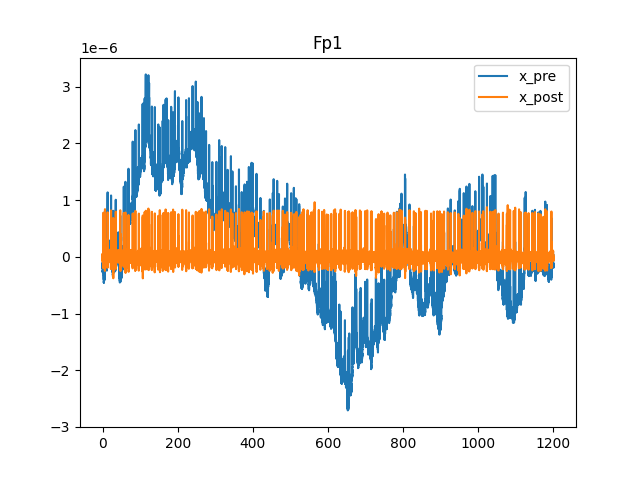

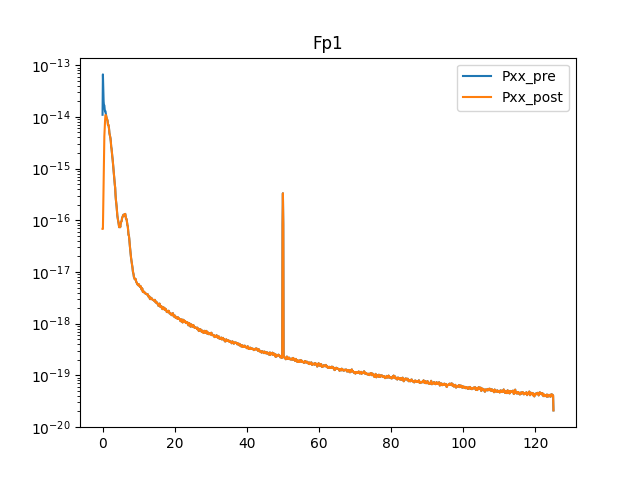

In [12]:
compare_pre_post(data_pre=EEG_data, data_post=raw.get_data(), srate=sampling_rate, chan_name='Fp1')
data_filter = raw.get_data()

In [13]:
raw.notch_filter(freqs=[50, 100], notch_widths=1)  # Filtre Notch pour le 50 Hz

Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 1651 samples (6.604 s)



<RawArray | 21 x 300000 (1200.0 s), ~48.1 MiB, data loaded>

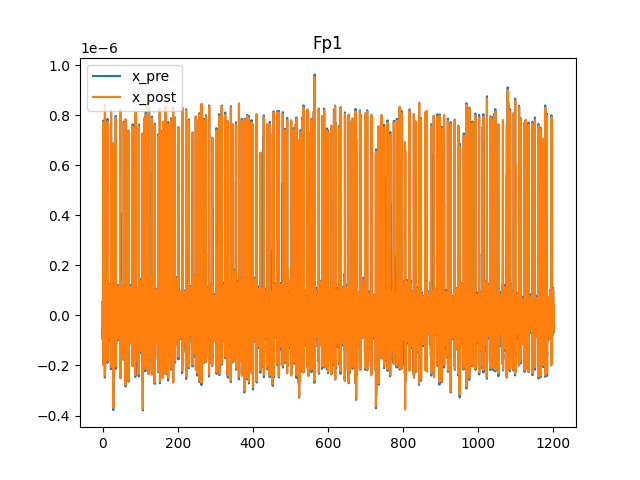

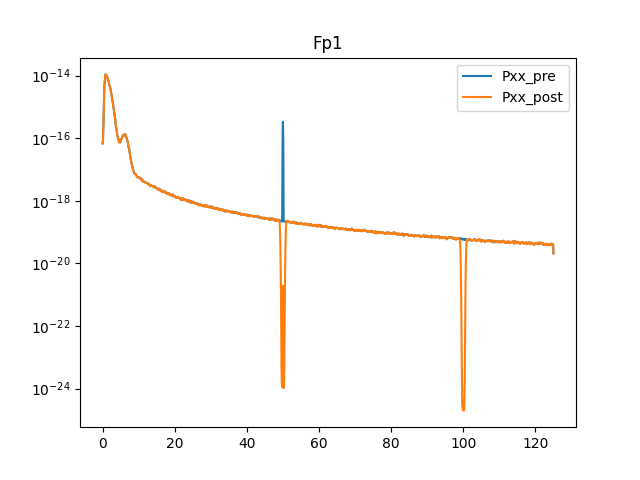

In [14]:
compare_pre_post(data_pre=data_filter, data_post=raw.get_data(), srate=sampling_rate, chan_name='Fp1')
data_filter = raw.get_data()

## ICA

In [17]:
ica = mne.preprocessing.ICA(n_components=10, random_state=42, method="fastica")
ica.fit(raw)

ica.plot_sources(raw)
ica.plot_components()

ImportError: The sklearn package is required to use method='fastica', package was not found

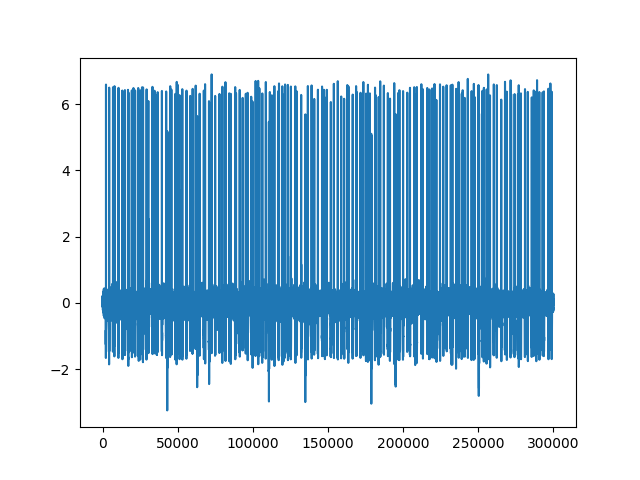

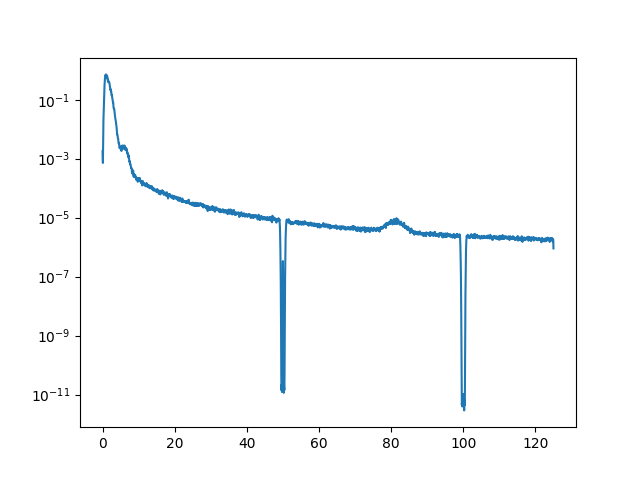

In [24]:
bad_comps = ica.exclude

# Extraire le signal des composantes rejetées
sources = ica.get_sources(raw)
rejected_signals = sources.get_data()[bad_comps, :].reshape(-1)

plt.figure()
plt.plot(rejected_signals)
plt.show()

plot_PSD(rejected_signals)

In [25]:
ica.apply(raw) # exclude component

Applying ICA to Raw instance
    Transforming to ICA space (10 components)
    Zeroing out 1 ICA component
    Projecting back using 21 PCA components


<RawArray | 21 x 300000 (1200.0 s), ~48.1 MiB, data loaded>

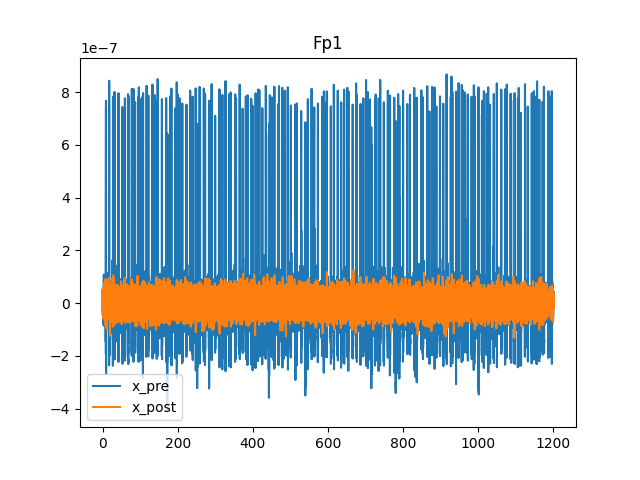

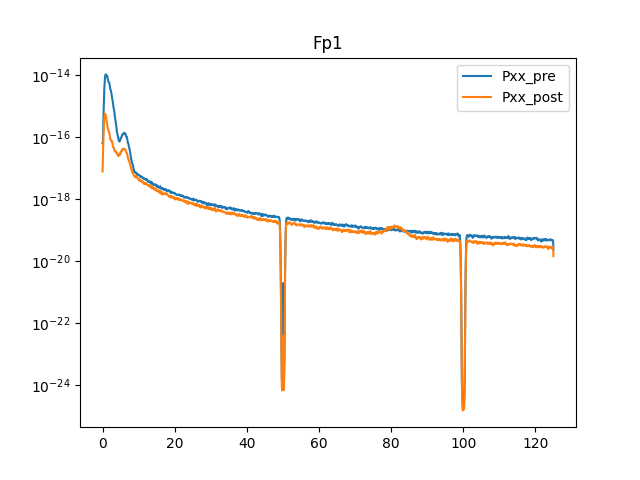

In [26]:
compare_pre_post(data_pre=data_filter, data_post=raw.get_data(), srate=sampling_rate, chan_name='Fp1')


In [27]:
EEG_data_clean = raw.get_data()

# ERP analysis

## epoching

In [28]:
info = mne.create_info(ch_names=channels, sfreq=sampling_rate, ch_types='eeg')
info.set_montage('standard_1020')

# Créer l'objet Raw à partir des données EEG
raw = mne.io.RawArray(EEG_data_clean, info)

# Créer un tableau d'événements avec trois colonnes
trig = 1
events = np.column_stack((trig_idxs[trig_type == trig], np.zeros(len(trig_idxs[trig_type == trig]), dtype=int), trig_type[trig_type == trig]))
epochs_1 = mne.Epochs(raw, events, tmin=-0.5, tmax=1.5, baseline=None, detrend=1, preload=True)
erp_1 = epochs_1.average()

trig = 2
events = np.column_stack((trig_idxs[trig_type == trig], np.zeros(len(trig_idxs[trig_type == trig]), dtype=int), trig_type[trig_type == trig]))
epochs_2 = mne.Epochs(raw, events, tmin=-0.5, tmax=1.5, baseline=None, detrend=1, preload=True)
erp_2 = epochs_2.average()

Creating RawArray with float64 data, n_channels=21, n_times=300000
    Range : 0 ... 299999 =      0.000 ...  1199.996 secs
Ready.
Not setting metadata
200 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 200 events and 501 original time points ...
0 bad epochs dropped
Not setting metadata
200 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 200 events and 501 original time points ...
0 bad epochs dropped


## stats

In [29]:
# Analyse statistique : Test de permutation cluster
perm_stats = {}
for ch_i, ch in enumerate(channels):

    perm_stats[ch] = mne.stats.permutation_cluster_1samp_test(epochs_1.get_data()[:,ch_i,:]-epochs_2.get_data()[:,ch_i,:], n_permutations=n_perm, 
                                                        tail=1, n_jobs=None, out_type="mask", threshold=8) # T_obs, clusters, cluster_p_values, H0   

stats_vec = np.zeros((len(channels), erp_1.times.size), dtype='bool')
for ch_i, ch in enumerate(channels):
    for c_i, c in enumerate(perm_stats[ch][1]):
        stats_vec[ch_i,c[0].start:c[0].stop] = True

stat_fun(H1): min=-3.507935603848023 max=3.0466361196389125
Running initial clustering …
Found 0 clusters


stat_fun(H1): min=-2.8461705213506656 max=3.1010831625289117
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=-1.8557562677094177 max=1.8790794157329673
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=-3.337878861289265 max=2.277782709938853
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=-2.69627255344342 max=3.7965287643240853
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=-2.5961979483897637 max=2.4856131682005254
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=-2.609794038313774 max=3.490510806809444
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=-3.4560048301926534 max=2.2161278176563415
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=-1.90785070442728 max=1.8550558791100376
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=-2.5279197954636436 max=2.0624654260901387
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=-3.0985926177179186 max=2.0

/tmp/ipykernel_39688/3745773381.py:5: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  perm_stats[ch] = mne.stats.permutation_cluster_1samp_test(epochs_1.get_data()[:,ch_i,:]-epochs_2.get_data()[:,ch_i,:], n_permutations=n_perm,
/tmp/ipykernel_39688/3745773381.py:5: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  perm_stats[ch] = mne.stats.permutation_cluster_1samp_test(epochs_1.get_data()[:,ch_i,:]-epochs_2.get_data()[:,ch_i,:], n_permutations=n_perm,
/tmp/ipykernel_39688/3745773381.py:5: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  perm_stats[ch] = mne.stats.permutation_cluster_1samp_test(epochs_1.get_data()[:,ch_i,:]-epochs_2.get_data()[:,ch_i,:], n_permutations=n_perm,
/tmp/ipykernel_39688/3745773381.py:5: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  perm_stats[ch] = mne.stats.permutation_cluster_1samp_test(epochs_1.get_data()[:,ch_i,:]-epochs

stat_fun(H1): min=-2.0192487482697334 max=2.2716903887468374
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=-2.061827880912534 max=1.8631401547184403
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=-2.221160984382272 max=2.8709685468746216
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=-9.416890330088298 max=11.663524781508283
Running initial clustering …
Found 1 cluster


/tmp/ipykernel_39688/3745773381.py:5: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  perm_stats[ch] = mne.stats.permutation_cluster_1samp_test(epochs_1.get_data()[:,ch_i,:]-epochs_2.get_data()[:,ch_i,:], n_permutations=n_perm,
/tmp/ipykernel_39688/3745773381.py:5: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  perm_stats[ch] = mne.stats.permutation_cluster_1samp_test(epochs_1.get_data()[:,ch_i,:]-epochs_2.get_data()[:,ch_i,:], n_permutations=n_perm,
/tmp/ipykernel_39688/3745773381.py:5: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  perm_stats[ch] = mne.stats.permutation_cluster_1samp_test(epochs_1.get_data()[:,ch_i,:]-epochs_2.get_data()[:,ch_i,:], n_permutations=n_perm,
/tmp/ipykernel_39688/3745773381.py:5: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  perm_stats[ch] = mne.stats.permutation_cluster_1samp_test(epochs_1.get_data()[:,ch_i,:]-epochs

  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

stat_fun(H1): min=-9.959491347818421 max=12.300518558109182
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

stat_fun(H1): min=-6.267317531325152 max=13.660568725149874
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

stat_fun(H1): min=-8.975465909008859 max=13.394740681406834
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

stat_fun(H1): min=-10.529088015637656 max=11.18813966999234
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

stat_fun(H1): min=-13.349270366185342 max=18.901909066336803
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

stat_fun(H1): min=-12.51453529501515 max=16.62851201924862
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

## plot ERP for each channel

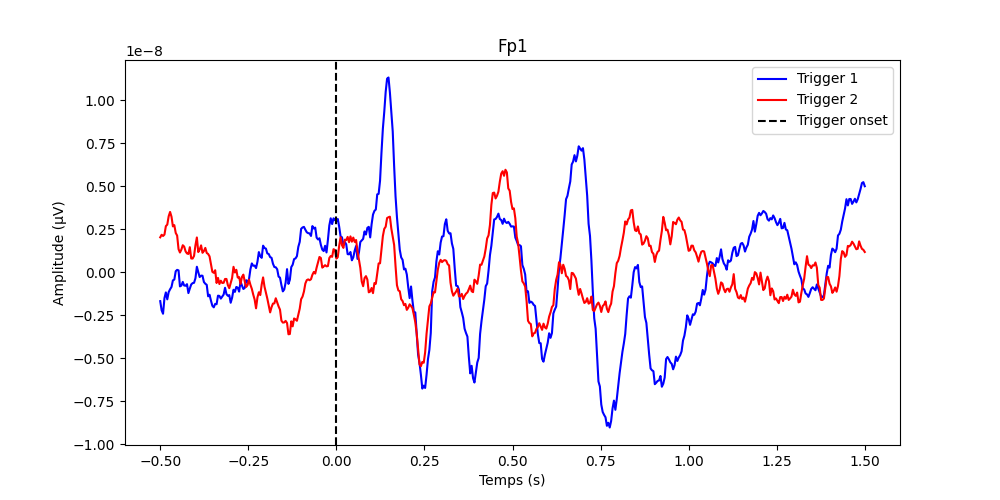

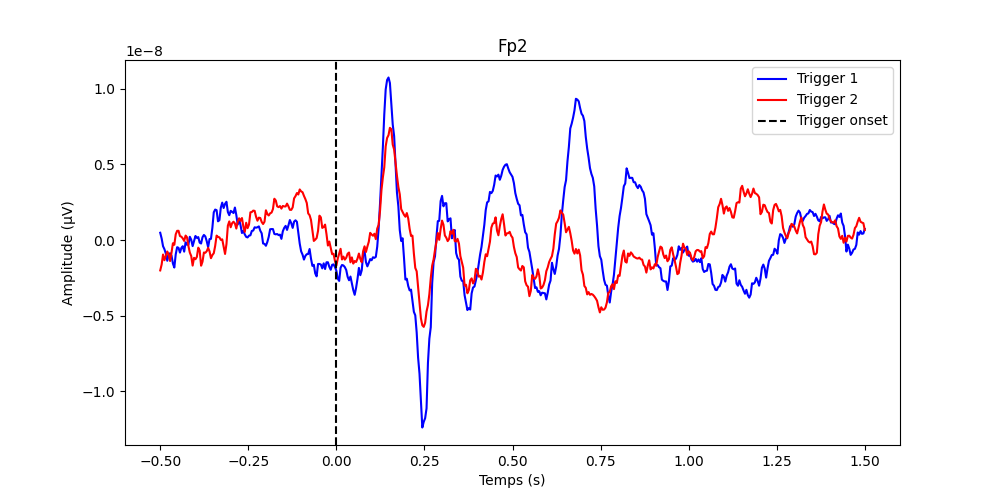

/tmp/ipykernel_39688/3019058827.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10, 5))


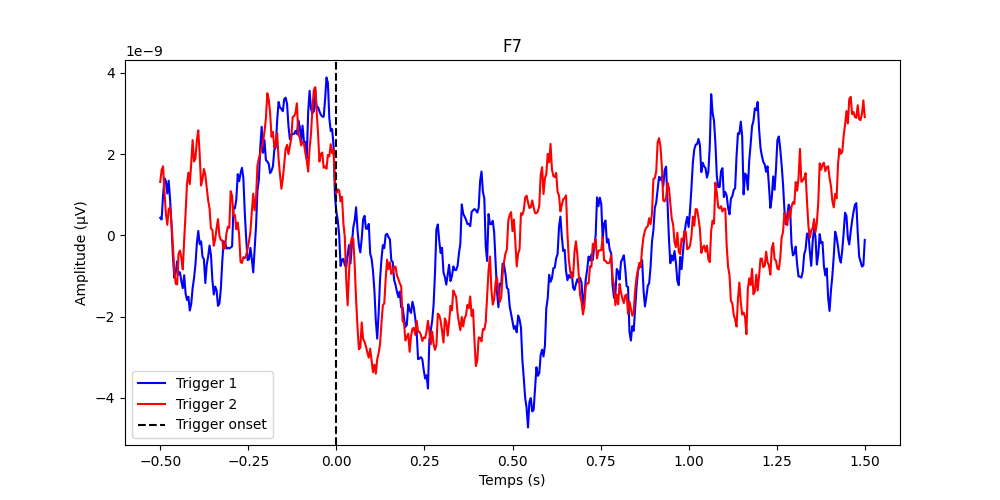

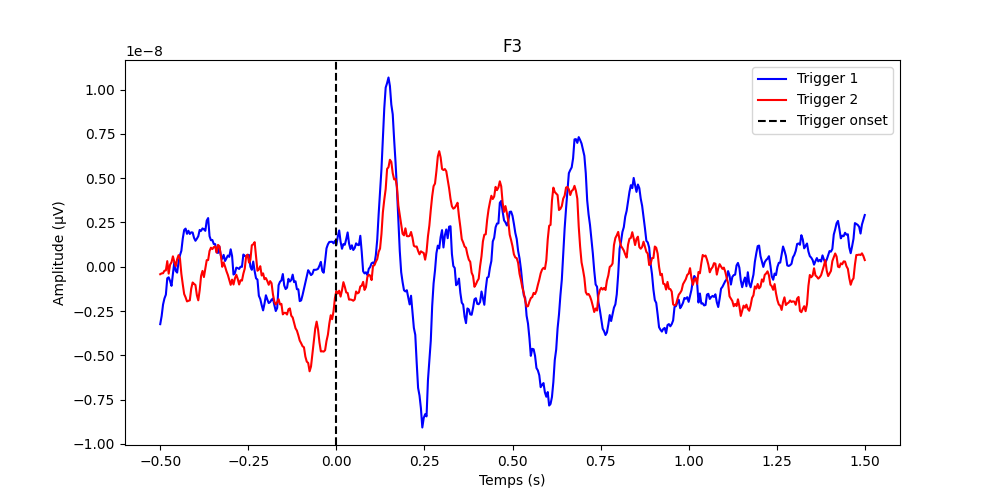

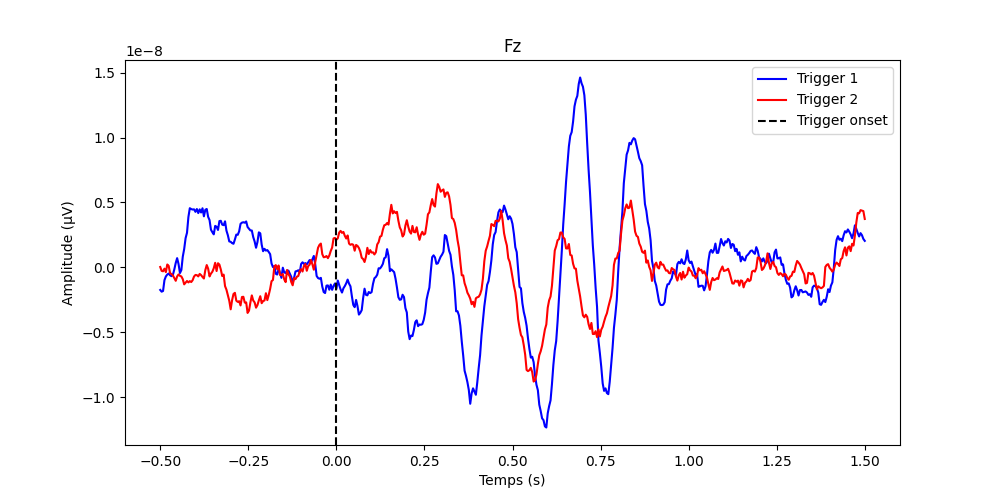

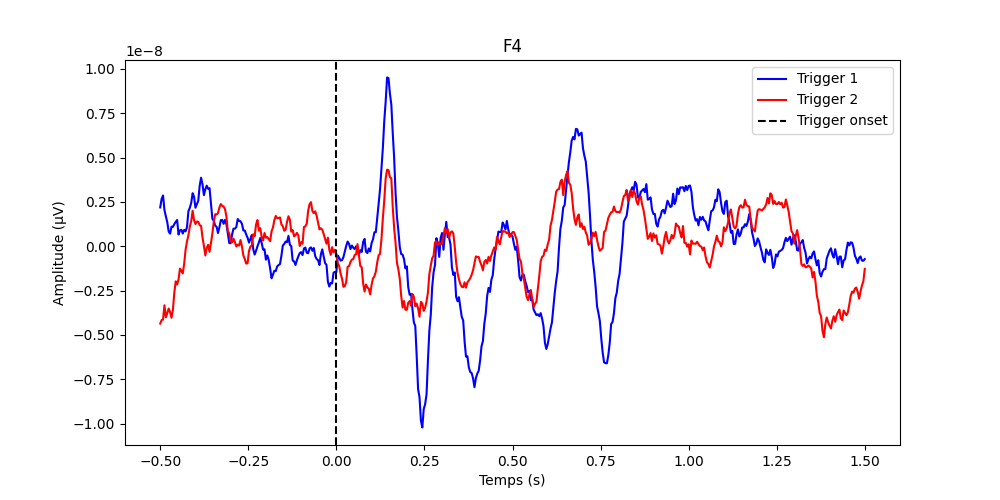

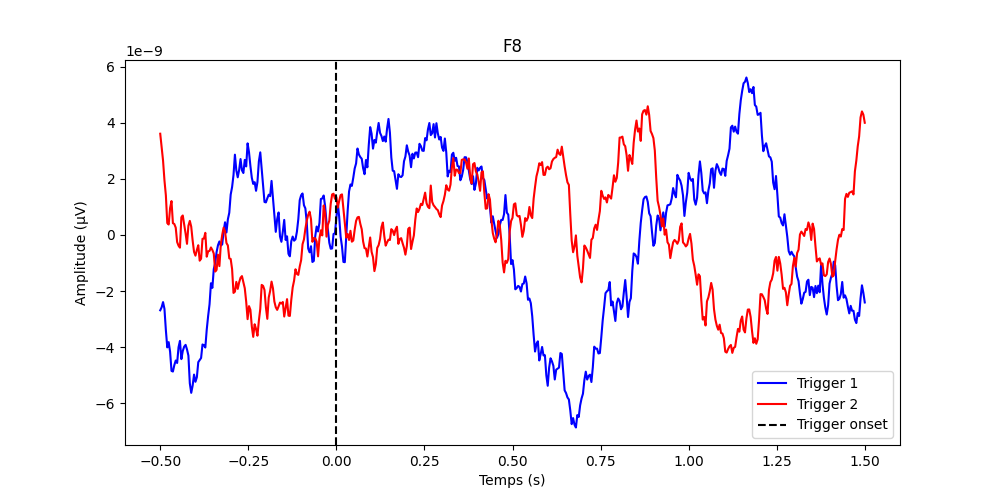

...

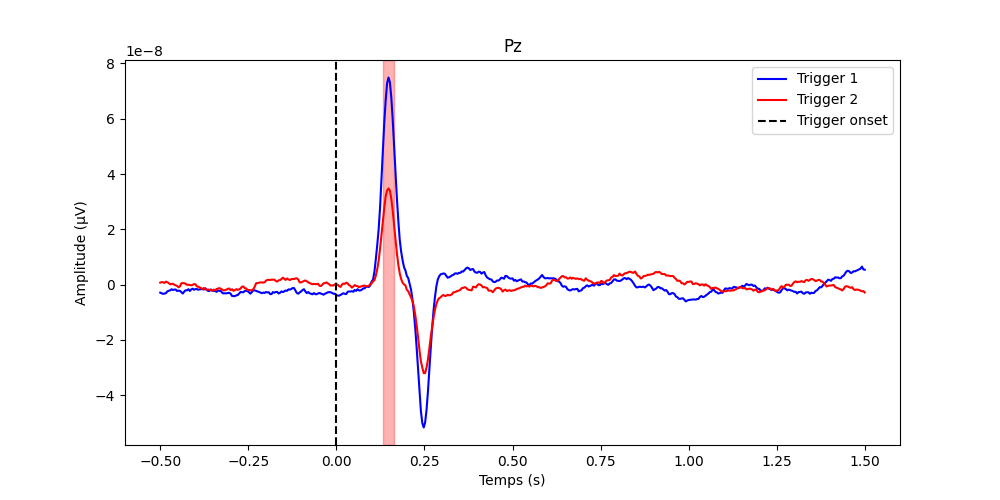

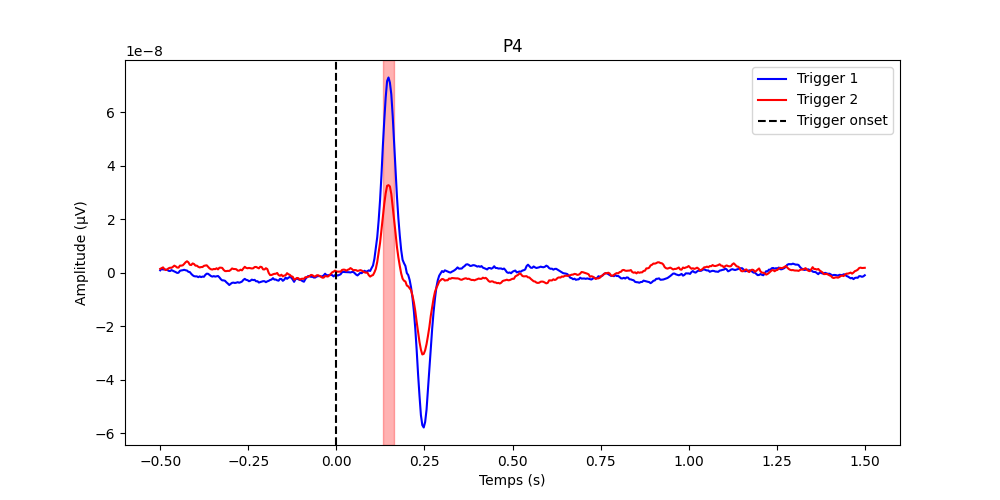

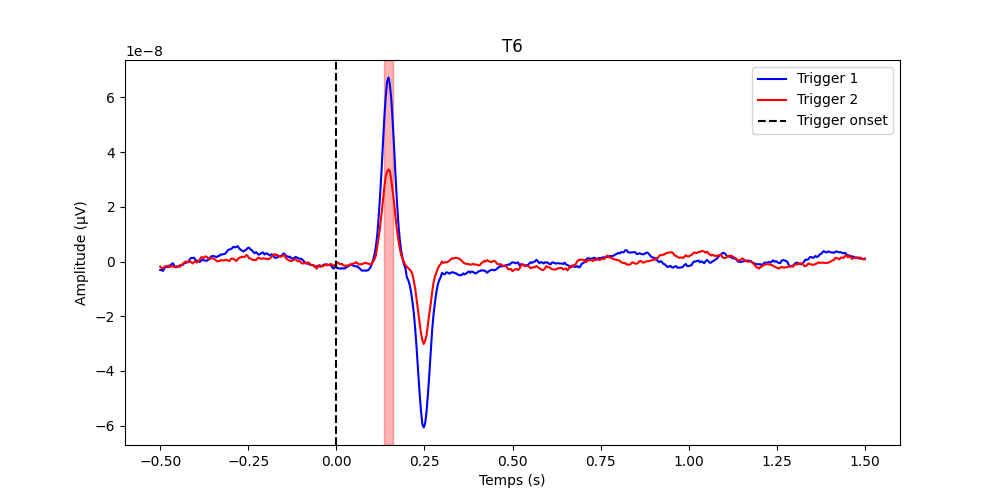

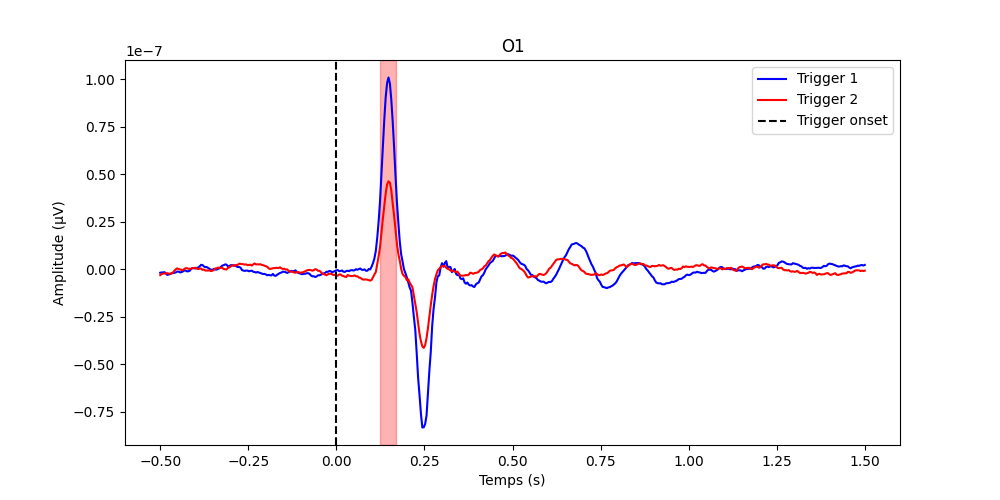

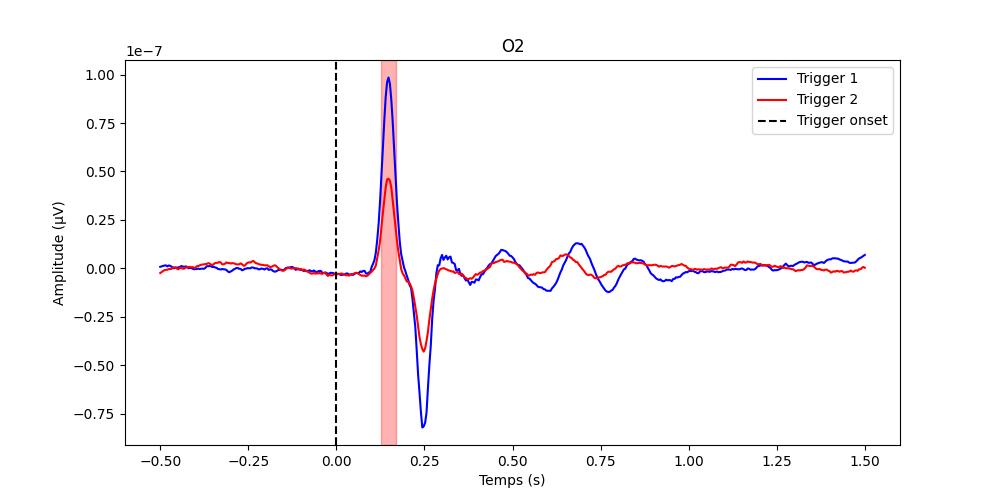

In [30]:
for ch_i, ch in enumerate(channels):

    # Tracer la différence ERP sur un canal
    times = erp_1.times
    fig, ax = plt.subplots(figsize=(10, 5))
    ax.plot(times, erp_1.data[ch_i], label="Trigger 1", color='blue')
    ax.plot(times, erp_2.data[ch_i], label="Trigger 2", color='red')
    ax.axvline(0, linestyle="--", color="black", label="Trigger onset")

    for i_c, c in enumerate(perm_stats[ch][1]):
        c = c[0]
        if perm_stats[ch][2][i_c] <= 0.05:
            h = ax.axvspan(times[c.start], times[c.stop - 1], color="r", alpha=0.3)
        # else:
            # ax.axvspan(times[c.start], times[c.stop - 1], color=(0.3, 0.3, 0.3), alpha=0.3)

    plt.legend()
    plt.title(f"{ch}")
    plt.xlabel("Temps (s)")
    plt.ylabel("Amplitude (µV)")
    plt.show(block=True)

## topoplot

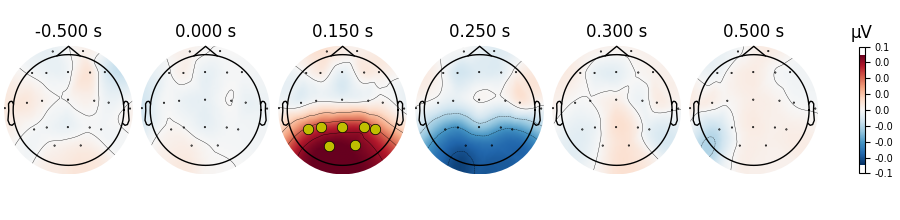

In [31]:
erp_diff = mne.combine_evoked([erp_1, erp_2], weights=[1, -1])

time_plot = [-0.5, 0, 0.150, 0.250, 0.3, 0.5]

mask_params = dict(markersize=15, markerfacecolor='y')
erp_diff.plot_topomap(times=time_plot, show=False, mask=stats_vec, mask_params=mask_params)
plt.show(block=True)

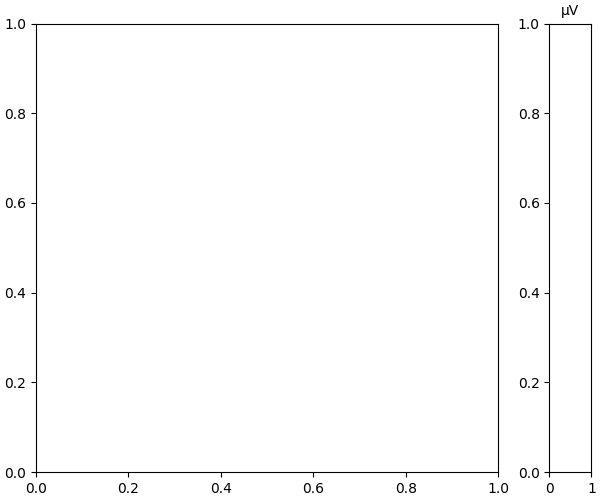

In [32]:
times = np.arange(0, 0.500, 0.01)
fig, anim = erp_diff.animate_topomap(times=times, frame_rate=2, blit=False)

# TF analysis

## compute TF

In [33]:
info = mne.create_info(ch_names=channels, sfreq=sampling_rate, ch_types='eeg')
info.set_montage('standard_1020')

# Créer l'objet Raw à partir des données EEG
raw = mne.io.RawArray(EEG_data_clean, info)

# Créer un tableau d'événements avec trois colonnes
trig = 1
events = np.column_stack((trig_idxs[trig_type == trig], np.zeros(len(trig_idxs[trig_type == trig]), dtype=int), trig_type[trig_type == trig]))
epochs_1 = mne.Epochs(raw, events, tmin=-0.5, tmax=1.5, baseline=None, detrend=1, preload=True)
erp_1 = epochs_1.average()

trig = 2
events = np.column_stack((trig_idxs[trig_type == trig], np.zeros(len(trig_idxs[trig_type == trig]), dtype=int), trig_type[trig_type == trig]))
epochs_2 = mne.Epochs(raw, events, tmin=-0.5, tmax=1.5, baseline=None, detrend=1, preload=True)
erp_2 = epochs_2.average()

decim = 2
freqs = np.arange(4, 120, 2)  # define frequencies of interest
n_cycles = np.linspace(4, 21, freqs.size)
tfr_kwargs = dict(
    method="morlet",
    freqs=freqs,
    n_cycles=n_cycles,
    decim=decim,
    return_itc=False,
    average=False,
)

tfr_epochs_1 = epochs_1.compute_tfr(**tfr_kwargs)
tfr_epochs_2 = epochs_2.compute_tfr(**tfr_kwargs)

tfr_epochs_1.apply_baseline(mode="ratio", baseline=(None, 0))
tfr_epochs_2.apply_baseline(mode="ratio", baseline=(None, 0))

Creating RawArray with float64 data, n_channels=21, n_times=300000
    Range : 0 ... 299999 =      0.000 ...  1199.996 secs
Ready.
Not setting metadata
200 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 200 events and 501 original time points ...
0 bad epochs dropped
Not setting metadata
200 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 200 events and 501 original time points ...
0 bad epochs dropped


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    6.7s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    7.1s


Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)


Data type,Power Estimates
Data source,Epochs
Number of epochs,200
Dims,"epoch, channel, freq, time"
Estimation method,morlet
Number of channels,21
Number of timepoints,251
Number of frequency bins,58
Frequency range,4.00 – 118.00 Hz


## plot TF for each channel

stat_fun(H1): min=-3.6533014777303503 max=10.930456136367876
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

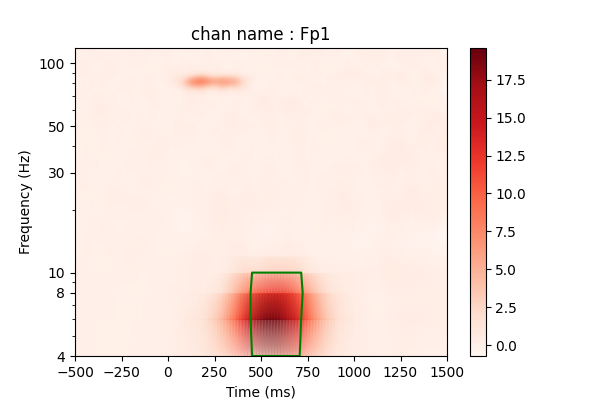

stat_fun(H1): min=-2.89258381726128 max=9.619982204764835
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

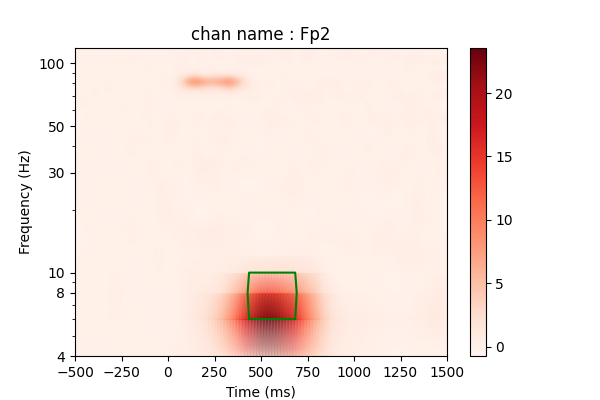

stat_fun(H1): min=-4.140212250377165 max=3.343354903349035
Running initial clustering …
Found 0 clusters


/tmp/ipykernel_39688/3433839879.py:6: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  F_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_1samp_test(


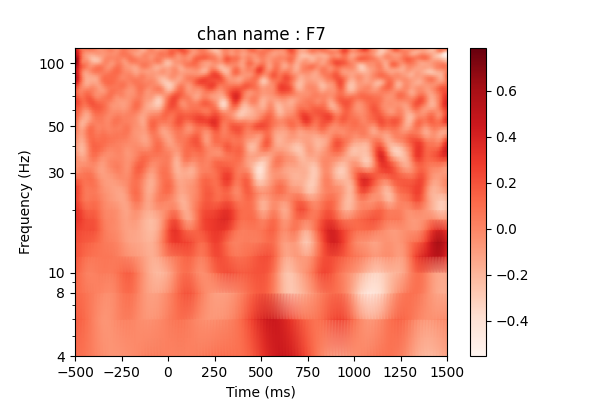

stat_fun(H1): min=-3.112849034083013 max=10.08928252489106
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

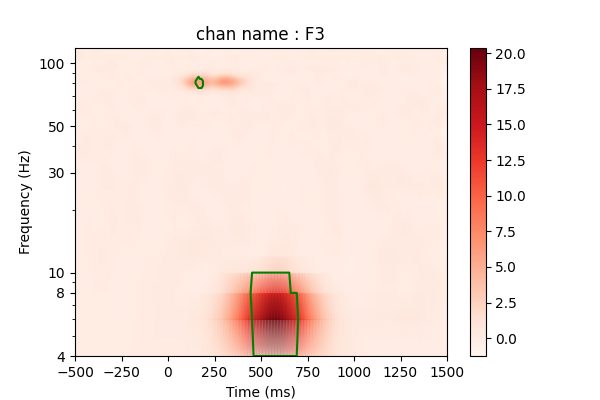

stat_fun(H1): min=-3.3676651477719126 max=10.337343725509376
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

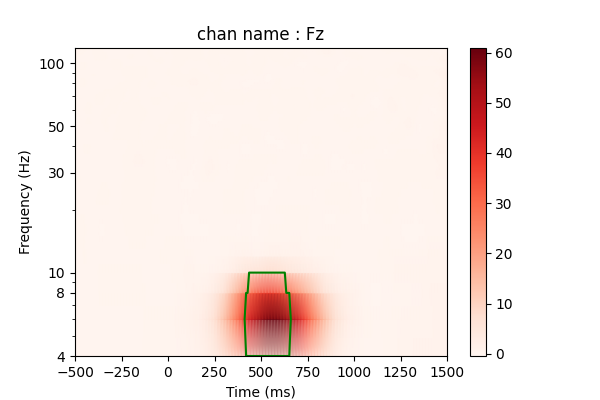

stat_fun(H1): min=-3.350364581413571 max=11.315411180608255
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

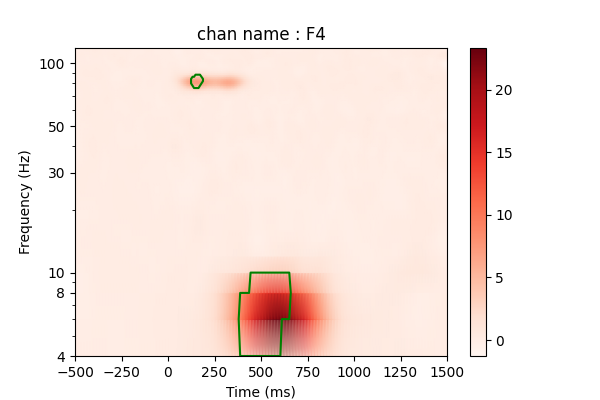

stat_fun(H1): min=-3.889758371378206 max=3.116725696199487
Running initial clustering …
Found 0 clusters


/tmp/ipykernel_39688/3433839879.py:6: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  F_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_1samp_test(


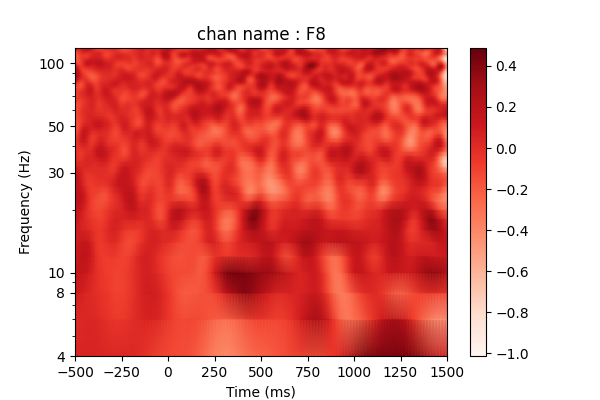

stat_fun(H1): min=-2.9170544954888924 max=3.282855618716956
Running initial clustering …
Found 0 clusters


/tmp/ipykernel_39688/3433839879.py:6: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  F_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_1samp_test(


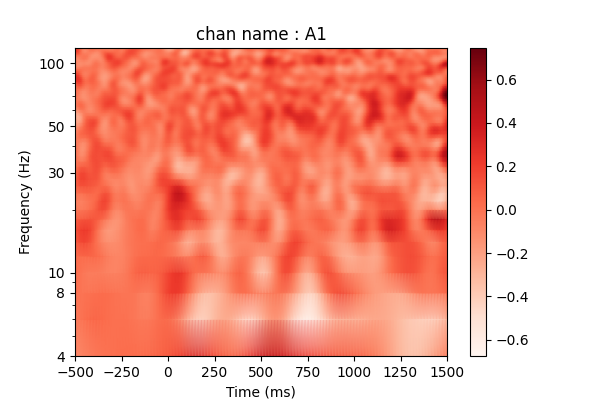

stat_fun(H1): min=-3.7604631221959433 max=3.701750730510457
Running initial clustering …
Found 0 clusters


/tmp/ipykernel_39688/3433839879.py:6: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  F_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_1samp_test(


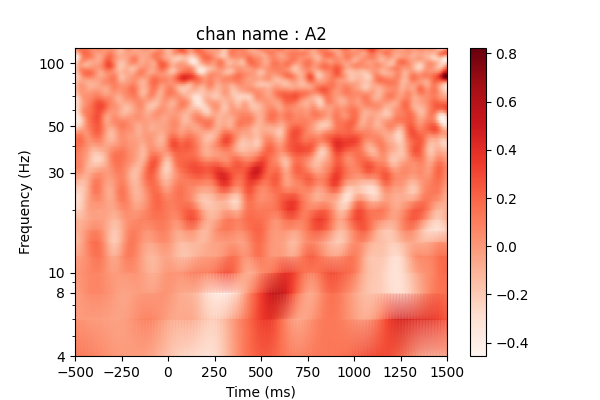

stat_fun(H1): min=-3.166365024140757 max=4.099843582945769
Running initial clustering …
Found 0 clusters


/tmp/ipykernel_39688/3433839879.py:6: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  F_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_1samp_test(


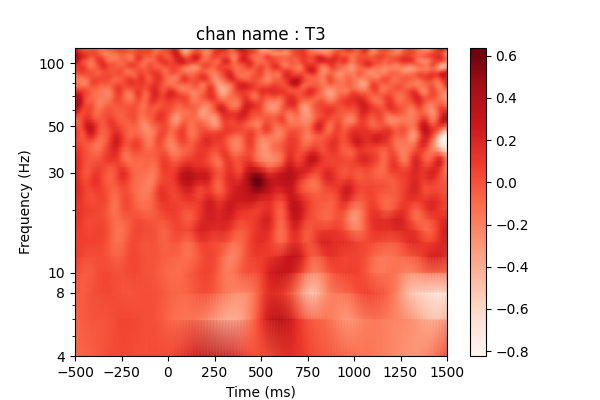

stat_fun(H1): min=-4.330702166993284 max=3.46796701835217
Running initial clustering …
Found 0 clusters


/tmp/ipykernel_39688/3433839879.py:6: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  F_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_1samp_test(


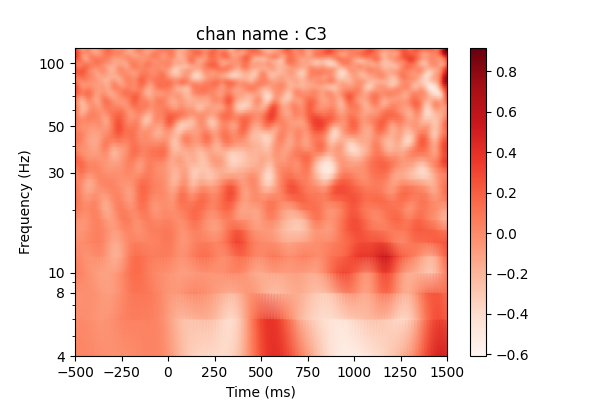

stat_fun(H1): min=-3.6297445935272608 max=3.2761696425093016
Running initial clustering …
Found 0 clusters


/tmp/ipykernel_39688/3433839879.py:6: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  F_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_1samp_test(


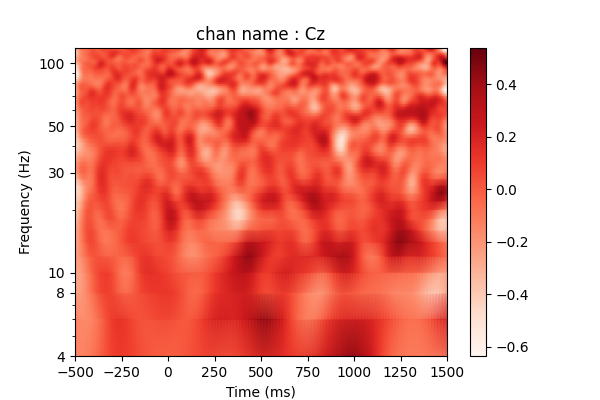

stat_fun(H1): min=-2.847933961188007 max=3.542878471552176
Running initial clustering …
Found 0 clusters


/tmp/ipykernel_39688/3433839879.py:6: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  F_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_1samp_test(


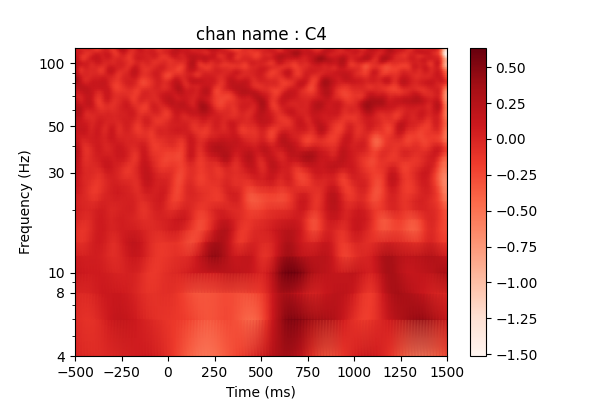

stat_fun(H1): min=-2.9998853028670758 max=3.319227274730765
Running initial clustering …
Found 0 clusters


/tmp/ipykernel_39688/3433839879.py:6: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  F_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_1samp_test(


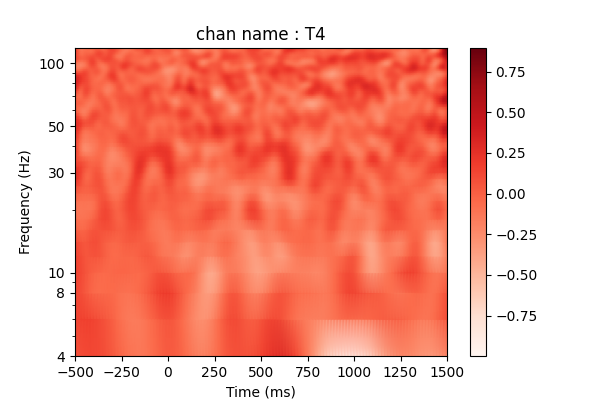

stat_fun(H1): min=-3.450487012187657 max=11.24401275910532
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

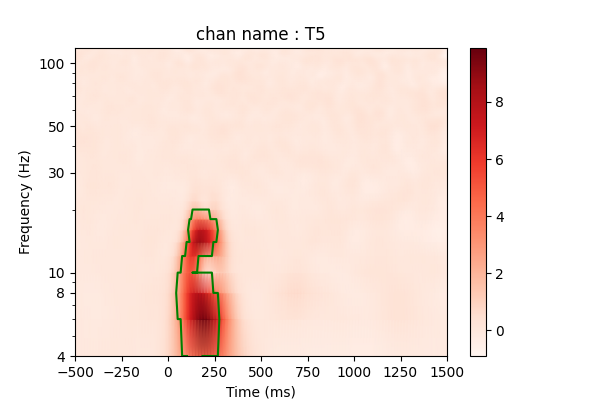

stat_fun(H1): min=-3.495686496224935 max=11.397165199852704
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

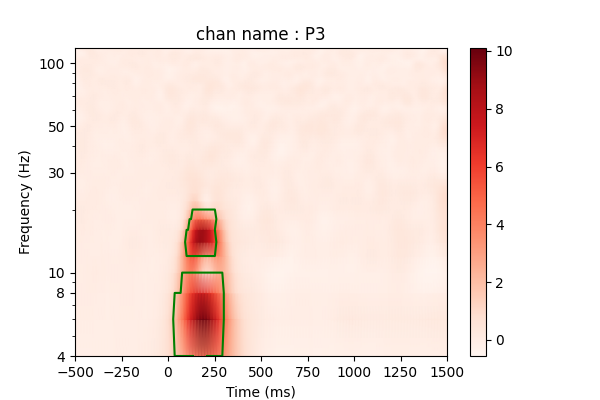

stat_fun(H1): min=-3.7358807591928915 max=10.856925135678026
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

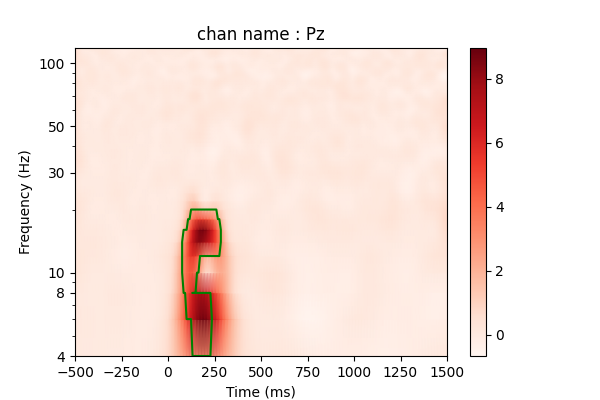

stat_fun(H1): min=-3.4020299734123247 max=10.844070465389185
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

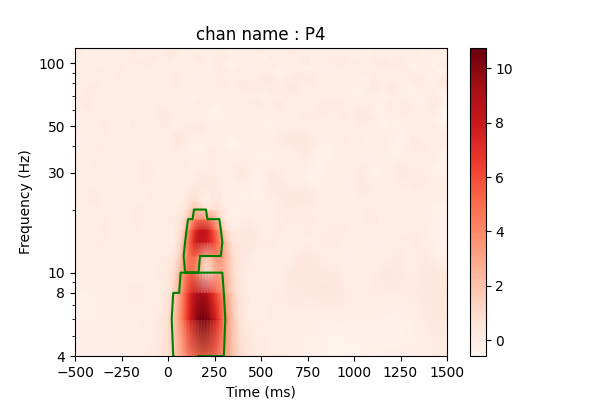

stat_fun(H1): min=-3.4660570568516915 max=11.169564461331081
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

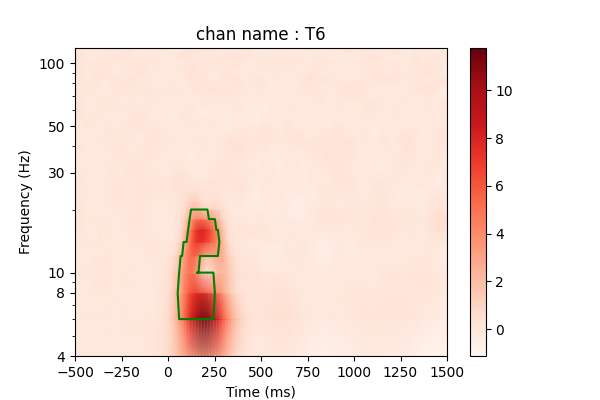

stat_fun(H1): min=-4.943173777311571 max=12.66034827558841
Running initial clustering …
Found 4 clusters


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

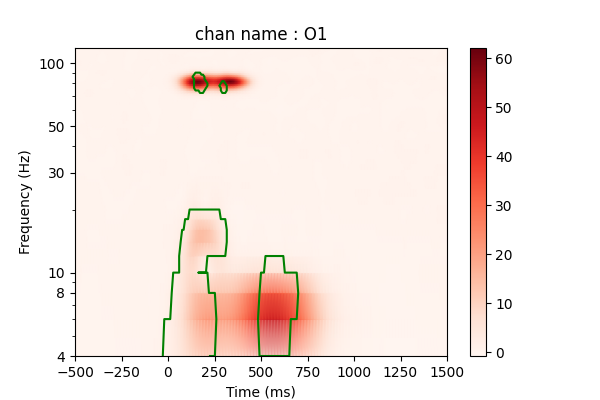

stat_fun(H1): min=-3.3987129815852546 max=15.397593446120954
Running initial clustering …
Found 4 clusters


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

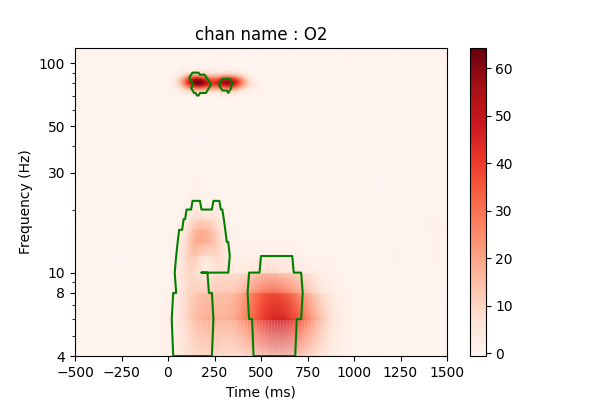

In [34]:
for ch_i, ch in enumerate(channels):

    epochs_power_1 = tfr_epochs_1.data[:, ch_i, :, :]  # only 1 channel as 3D matrix
    epochs_power_2 = tfr_epochs_2.data[:, ch_i, :, :]  # only 1 channel as 3D matrix

    F_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_1samp_test(
        epochs_power_1-epochs_power_2,
        out_type="mask",
        n_permutations=n_perm,
        threshold=8,
        tail=0,
        seed=np.random.default_rng(seed=8675309))
    
    times = 1e3 * tfr_epochs_1.times  # change unit to ms

    # Compute the difference in evoked to determine which was greater since
    # we used a 1-way ANOVA which tested for a difference in population means
    evoked_power_1 = epochs_power_1.mean(axis=0)
    evoked_power_2 = epochs_power_2.mean(axis=0)
    evoked_power_contrast = evoked_power_1 - evoked_power_2

    # Create new stats image with only significant clusters
    F_obs_plot = np.zeros((F_obs.shape))
    for c, p_val in zip(clusters, cluster_p_values):
        if p_val <= 0.05:
            F_obs_plot[c] = True

    fig, ax = plt.subplots(figsize=(6, 4))

    im = ax.pcolormesh(times, freqs, evoked_power_contrast, shading='gouraud', cmap=plt.get_cmap('Reds'))

    ax.contour(times, freqs, F_obs_plot, levels=0, colors='g')

    ax.set_xlabel("Time (ms)")
    ax.set_ylabel("Frequency (Hz)")
    ax.set_title(f"chan name : {ch}")

    ax.set_yscale('log')

    ax.set_yticks([4,8,10,30,50,100,120], labels=[4,8,10,30,50,100,120])
    ax.set_ylim(freqs[0], freqs[-1])

    fig.colorbar(im, ax=ax)

    plt.show(block=True)

## stats theta

In [35]:
band, freq = 'theta', [4,8]

# Extraire l'intervalle fréquentiel
freq_idx = np.where((tfr_epochs_1.freqs >= freq[0]) & (tfr_epochs_1.freqs <= freq[1]))[0]

# Moyenne de puissance dans la bande sélectionnée
power_data_1 = np.mean(tfr_epochs_1.data[:, :, freq_idx, :], axis=2)  # Shape: (n_epochs, n_channels, n_times)
power_data_2 = np.mean(tfr_epochs_2.data[:, :, freq_idx, :], axis=2)  # Shape: (n_epochs, n_channels, n_times)

# Créer une nouvelle structure EpochsArray
power_epoch_1 = mne.EpochsArray(power_data_1, tfr_epochs_1.info, tmin=tfr_epochs_1.times[0], events=tfr_epochs_1.events, event_id=tfr_epochs_1.event_id)
power_epoch_2 = mne.EpochsArray(power_data_2, tfr_epochs_2.info, tmin=tfr_epochs_2.times[0], events=tfr_epochs_2.events, event_id=tfr_epochs_2.event_id)

# Analyse statistique : Test de permutation cluster
perm_stats = {}
for ch_i, ch in enumerate(channels):
    perm_stats[ch] = mne.stats.permutation_cluster_test([power_epoch_1.get_data()[:,ch_i,:], power_epoch_2.get_data()[:,ch_i,:]], n_permutations=n_perm, 
                                                        tail=1, n_jobs=None, out_type="mask", threshold=8) # T_obs, clusters, cluster_p_values, H0   

stats_vec = np.zeros((len(channels), erp_1.times.size), dtype='bool')
for ch_i, ch in enumerate(channels):
    for c_i, c in enumerate(perm_stats[ch][1]):
        stats_vec[ch_i,c[0].start:c[0].stop] = True

Not setting metadata
200 matching events found


No baseline correction applied
0 projection items activated
Not setting metadata
200 matching events found
No baseline correction applied
0 projection items activated
stat_fun(H1): min=7.627981868352645e-05 max=167.80800703700038
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

stat_fun(H1): min=2.828783377894114e-05 max=82.65452482598117
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

stat_fun(H1): min=1.4307573266089566e-05 max=2.964296346498642
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=6.282035390324853e-05 max=116.07457259078414
Running initial clustering …
Found 1 cluster


/tmp/ipykernel_39688/2050420250.py:17: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  perm_stats[ch] = mne.stats.permutation_cluster_test([power_epoch_1.get_data()[:,ch_i,:], power_epoch_2.get_data()[:,ch_i,:]], n_permutations=n_perm,


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

stat_fun(H1): min=1.1860824260908195e-06 max=134.6355169144569
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

stat_fun(H1): min=0.00022939833246349707 max=150.62555392774564
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

stat_fun(H1): min=3.887159461424028e-05 max=1.9921890540233718
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=4.467977223064732e-05 max=2.608212509573042
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=7.985896123947525e-06 max=4.185933502456827
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=2.808140545525506e-06 max=3.9191115385205095
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=0.00021111012130020377 max=5.2571997699825035
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=6.451867792939789e-06 max=6.820052204512374
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=9.392407843051639e-07 max=4.618810971392254
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=0.00014884848027563475 max=8.624046563697027
Running initial clustering …
Found 1 cluster


/tmp/ipykernel_39688/2050420250.py:17: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  perm_stats[ch] = mne.stats.permutation_cluster_test([power_epoch_1.get_data()[:,ch_i,:], power_epoch_2.get_data()[:,ch_i,:]], n_permutations=n_perm,
/tmp/ipykernel_39688/2050420250.py:17: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  perm_stats[ch] = mne.stats.permutation_cluster_test([power_epoch_1.get_data()[:,ch_i,:], power_epoch_2.get_data()[:,ch_i,:]], n_permutations=n_perm,
/tmp/ipykernel_39688/2050420250.py:17: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  perm_stats[ch] = mne.stats.permutation_cluster_test([power_epoch_1.get_data()[:,ch_i,:], power_epoch_2.get_data()[:,ch_i,:]], n_permutations=n_perm,
/tmp/ipykernel_39688/2050420250.py:17: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  perm_stats[ch] = mne.stats.permutation_cluster_test([power_epoch_1.ge

  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

stat_fun(H1): min=0.00013088473305347367 max=152.16655225459576
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

stat_fun(H1): min=2.3113241929811742e-07 max=181.15236151585728
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

stat_fun(H1): min=2.8560066981300944e-08 max=99.32013322540367
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

stat_fun(H1): min=0.00027676575440950464 max=168.20462410828358
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

stat_fun(H1): min=0.0021253010215609817 max=103.28588840503467
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

stat_fun(H1): min=0.005653199273350211 max=189.55839794184874
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

stat_fun(H1): min=0.0031765265155106136 max=163.06168351922236
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

## topoplot theta

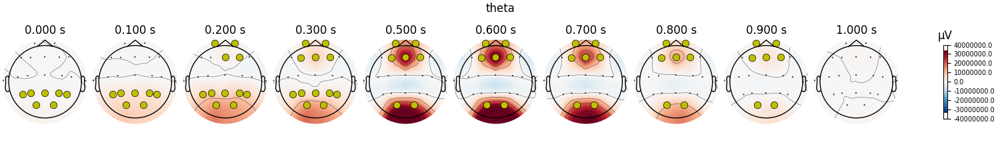

In [36]:
power_diff = mne.combine_evoked([power_epoch_1.average(), power_epoch_2.average()], weights=[1, -1])

time_plot = [0, 0.1, 0.2, 0.3, 0.5, 0.6, 0.7, 0.8, 0.9, 1]

mask_params = dict(markersize=15, markerfacecolor='y')
power_diff.plot_topomap(times=time_plot, show=False, mask=stats_vec, mask_params=mask_params)
plt.suptitle(band)
plt.show(block=True)

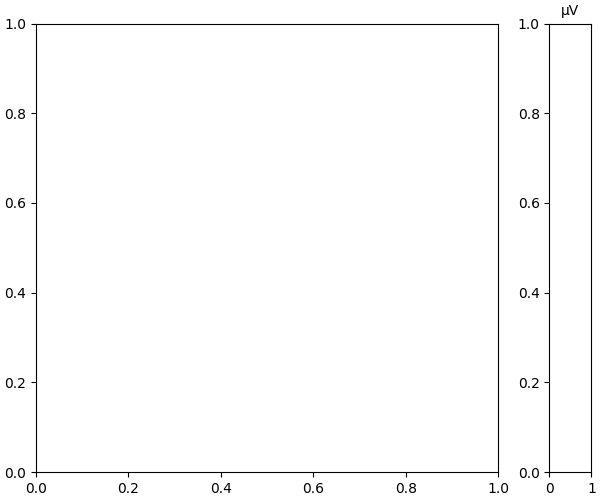

In [37]:
times = np.arange(0, 0.500, 0.01)
fig, anim = power_diff.animate_topomap(times=times, frame_rate=2, blit=False)

## stats gamma

In [38]:
band, freq = 'gamma', [60,120]

# Extraire l'intervalle fréquentiel
freq_idx = np.where((tfr_epochs_1.freqs >= freq[0]) & (tfr_epochs_1.freqs <= freq[1]))[0]

# Moyenne de puissance dans la bande sélectionnée
power_data_1 = np.mean(tfr_epochs_1.data[:, :, freq_idx, :], axis=2)  # Shape: (n_epochs, n_channels, n_times)
power_data_2 = np.mean(tfr_epochs_2.data[:, :, freq_idx, :], axis=2)  # Shape: (n_epochs, n_channels, n_times)

# Créer une nouvelle structure EpochsArray
power_epoch_1 = mne.EpochsArray(power_data_1, tfr_epochs_1.info, tmin=tfr_epochs_1.times[0], events=tfr_epochs_1.events, event_id=tfr_epochs_1.event_id)
power_epoch_2 = mne.EpochsArray(power_data_2, tfr_epochs_2.info, tmin=tfr_epochs_2.times[0], events=tfr_epochs_2.events, event_id=tfr_epochs_2.event_id)

# Analyse statistique : Test de permutation cluster
perm_stats = {}
for ch_i, ch in enumerate(channels):
    perm_stats[ch] = mne.stats.permutation_cluster_test([power_epoch_1.get_data()[:,ch_i,:], power_epoch_2.get_data()[:,ch_i,:]], n_permutations=n_perm, 
                                                        tail=1, n_jobs=None, out_type="mask", threshold=8) # T_obs, clusters, cluster_p_values, H0   

stats_vec = np.zeros((len(channels), erp_1.times.size), dtype='bool')
for ch_i, ch in enumerate(channels):
    for c_i, c in enumerate(perm_stats[ch][1]):
        stats_vec[ch_i,c[0].start:c[0].stop] = True

Not setting metadata
200 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
200 matching events found
No baseline correction applied
0 projection items activated
stat_fun(H1): min=1.5864151434400497e-05 max=61.32993212275387
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

stat_fun(H1): min=1.2732840631252221e-05 max=58.081860774257756
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

stat_fun(H1): min=6.648000958214287e-05 max=5.13257214288615
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=3.9775112712352273e-05 max=53.77528720110011
Running initial clustering …
Found 1 cluster


/tmp/ipykernel_39688/660451883.py:17: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  perm_stats[ch] = mne.stats.permutation_cluster_test([power_epoch_1.get_data()[:,ch_i,:], power_epoch_2.get_data()[:,ch_i,:]], n_permutations=n_perm,


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

stat_fun(H1): min=0.00023472789183932836 max=7.7842223744830035
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=0.0006006909408788493 max=69.47228060401025
Running initial clustering …
Found 1 cluster


/tmp/ipykernel_39688/660451883.py:17: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  perm_stats[ch] = mne.stats.permutation_cluster_test([power_epoch_1.get_data()[:,ch_i,:], power_epoch_2.get_data()[:,ch_i,:]], n_permutations=n_perm,


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

stat_fun(H1): min=1.3378056040200297e-06 max=3.2573548136142105
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=1.6043784059989133e-05 max=7.188664206643628
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=0.00016871817771926885 max=6.543685355417043
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=2.3023759846203207e-07 max=3.5336885784025194
Running initial clustering …
Found 0 clusters


/tmp/ipykernel_39688/660451883.py:17: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  perm_stats[ch] = mne.stats.permutation_cluster_test([power_epoch_1.get_data()[:,ch_i,:], power_epoch_2.get_data()[:,ch_i,:]], n_permutations=n_perm,
/tmp/ipykernel_39688/660451883.py:17: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  perm_stats[ch] = mne.stats.permutation_cluster_test([power_epoch_1.get_data()[:,ch_i,:], power_epoch_2.get_data()[:,ch_i,:]], n_permutations=n_perm,
/tmp/ipykernel_39688/660451883.py:17: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  perm_stats[ch] = mne.stats.permutation_cluster_test([power_epoch_1.get_data()[:,ch_i,:], power_epoch_2.get_data()[:,ch_i,:]], n_permutations=n_perm,
/tmp/ipykernel_39688/660451883.py:17: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  perm_stats[ch] = mne.stats.permutation_cluster_test([power_epoch_1.get_da

stat_fun(H1): min=9.618421927736176e-05 max=14.98113672589537
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

stat_fun(H1): min=5.898653254330522e-05 max=8.590985149907212
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

stat_fun(H1): min=0.0004968995777887086 max=8.66532433148628
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

stat_fun(H1): min=6.720314727186654e-08 max=3.994419809017222
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=3.5156412592050477e-06 max=6.6768824768350274
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=1.0708352568068378e-06 max=10.035071106360252
Running initial clustering …
Found 1 cluster


/tmp/ipykernel_39688/660451883.py:17: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  perm_stats[ch] = mne.stats.permutation_cluster_test([power_epoch_1.get_data()[:,ch_i,:], power_epoch_2.get_data()[:,ch_i,:]], n_permutations=n_perm,
/tmp/ipykernel_39688/660451883.py:17: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  perm_stats[ch] = mne.stats.permutation_cluster_test([power_epoch_1.get_data()[:,ch_i,:], power_epoch_2.get_data()[:,ch_i,:]], n_permutations=n_perm,


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

stat_fun(H1): min=7.37366767833597e-05 max=3.8915658334673027
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=1.0605998740539498e-07 max=3.3950726485929215
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=4.0970157744050626e-05 max=7.3915787436582665
Running initial clustering …
Found 0 clusters


/tmp/ipykernel_39688/660451883.py:17: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  perm_stats[ch] = mne.stats.permutation_cluster_test([power_epoch_1.get_data()[:,ch_i,:], power_epoch_2.get_data()[:,ch_i,:]], n_permutations=n_perm,
/tmp/ipykernel_39688/660451883.py:17: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  perm_stats[ch] = mne.stats.permutation_cluster_test([power_epoch_1.get_data()[:,ch_i,:], power_epoch_2.get_data()[:,ch_i,:]], n_permutations=n_perm,


stat_fun(H1): min=0.00031433862213554387 max=81.13173548419421
Running initial clustering …
Found 1 cluster


/tmp/ipykernel_39688/660451883.py:17: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  perm_stats[ch] = mne.stats.permutation_cluster_test([power_epoch_1.get_data()[:,ch_i,:], power_epoch_2.get_data()[:,ch_i,:]], n_permutations=n_perm,


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

stat_fun(H1): min=3.438034323699615e-06 max=77.8501519194852
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

## topoplot gamma

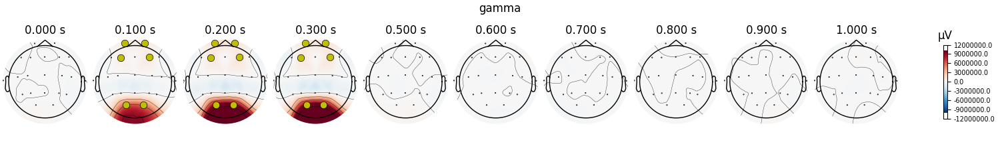

In [39]:
power_diff = mne.combine_evoked([power_epoch_1.average(), power_epoch_2.average()], weights=[1, -1])

time_plot = [0, 0.1, 0.2, 0.3, 0.5, 0.6, 0.7, 0.8, 0.9, 1]

mask_params = dict(markersize=15, markerfacecolor='y')
power_diff.plot_topomap(times=time_plot, show=False, mask=stats_vec, mask_params=mask_params)
plt.suptitle(band)
plt.show(block=True)

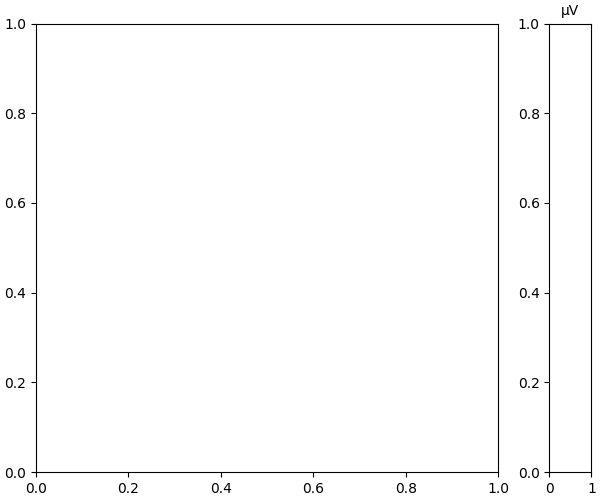

In [40]:
times = np.arange(0, 0.500, 0.01)
fig, anim = power_diff.animate_topomap(times=times, frame_rate=2, blit=False)